In [68]:
%matplotlib inline
%load_ext autoreload

import warnings
warnings.filterwarnings("ignore") # disable warnings

from os import getcwd
from os.path import join, abspath, pardir, exists
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.offline as pyo
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

from scipy.stats import ttest_ind, chi2_contingency
from scipy.stats.stats import pearsonr
from IPython.core.interactiveshell import InteractiveShell

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


##### Config settings

In [105]:
parent_dir = abspath(join(join(getcwd(), pardir), pardir))
data_dir = join(parent_dir, "data")
data_file = join(data_dir, "speed_dating.csv")

# For IPython

InteractiveShell.ast_node_interactivity = "all" # To show all output after each cell execution (instead of the last output)

# For pandas

pd.options.display.max_columns = 200 # display upto 200 columns (instead of default 20)
pd.options.display.max_rows = 200 # display upto 200 rows (instead of default 60)
pd.options.mode.use_inf_as_na = True # Consider '' and np.inf as np.NaN values (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isna.html)


In [3]:
# df = pd.read_csv(data_file, encoding= 'unicode_escape')
df = pd.read_csv(data_file, encoding= 'ISO-8859-1')
df.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,partner,pid,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,pf_o_amb,pf_o_sha,dec_o,attr_o,sinc_o,intel_o,fun_o,amb_o,shar_o,like_o,prob_o,met_o,age,field,field_cd,undergra,mn_sat,tuition,race,imprace,imprelig,from,zipcode,income,goal,date,go_out,career,career_c,sports,tvsports,exercise,dining,museums,art,hiking,gaming,clubbing,reading,tv,theater,movies,concerts,music,shopping,yoga,exphappy,expnum,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,attr4_1,sinc4_1,intel4_1,fun4_1,amb4_1,shar4_1,attr2_1,sinc2_1,intel2_1,fun2_1,amb2_1,shar2_1,attr3_1,sinc3_1,fun3_1,intel3_1,amb3_1,attr5_1,sinc5_1,intel5_1,fun5_1,amb5_1,dec,attr,sinc,intel,fun,amb,shar,like,prob,met,match_es,attr1_s,sinc1_s,intel1_s,fun1_s,amb1_s,shar1_s,attr3_s,sinc3_s,intel3_s,fun3_s,amb3_s,satis_2,length,numdat_2,attr7_2,sinc7_2,intel7_2,fun7_2,amb7_2,shar7_2,attr1_2,sinc1_2,intel1_2,fun1_2,amb1_2,shar1_2,attr4_2,sinc4_2,intel4_2,fun4_2,amb4_2,shar4_2,attr2_2,sinc2_2,intel2_2,fun2_2,amb2_2,shar2_2,attr3_2,sinc3_2,intel3_2,fun3_2,amb3_2,attr5_2,sinc5_2,intel5_2,fun5_2,amb5_2,you_call,them_cal,date_3,numdat_3,num_in_3,attr1_3,sinc1_3,intel1_3,fun1_3,amb1_3,shar1_3,attr7_3,sinc7_3,intel7_3,fun7_3,amb7_3,shar7_3,attr4_3,sinc4_3,intel4_3,fun4_3,amb4_3,shar4_3,attr2_3,sinc2_3,intel2_3,fun2_3,amb2_3,shar2_3,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,1,11.0,0,0.14,0,27.0,2.0,35.0,20.0,20.0,20.0,0.0,5.0,0,6.0,8.0,8.0,8.0,8.0,6.0,7.0,4.0,2.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,6.0,9.0,7.0,7.0,6.0,5.0,7.0,6.0,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,2,12.0,0,0.54,0,22.0,2.0,60.0,0.0,0.0,40.0,0.0,0.0,0,7.0,8.0,10.0,7.0,7.0,5.0,8.0,4.0,2.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,7.0,8.0,7.0,8.0,5.0,6.0,7.0,5.0,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,3,13.0,1,0.16,1,22.0,4.0,19.0,18.0,19.0,18.0,14.0,12.0,1,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,1.0,21.0,Law,1.0,NaN,NaN,NaN,4.0,2.0,4.0,Chicago,"60,521","69,487.00",2.0,7.0,1.0,lawyer,NaN,9.0,2.0,8.0,9.0,1.0,1.0,5.0,1.0,5.0,6.0,9.0,1.0,10.0,10.0,9.0,8.0,1.0,3.0,2.0,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,35.0,20.0,15.0,20.0,5.0,5.0,6.0,8.0,8.0,8.0,7.0,NaN,NaN,NaN,NaN,NaN,1,5.0,8.0,9.0,8.0,5.0,7.0,7.0,NaN,1.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,19.44,16.67,13.89,22.22,11.11,16.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,7.0,8.0,7.0,6.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,15.0,20.0,20.0,15.0,15.0,15.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,4,14.0,1,0.61,0,23.0,2.0,30.0,5.0,15.0,40.0,5.0,5.0,1,7.0,8.0,9.0,8.0,9

##### Basic checks

In [4]:
len(df)
len(df.columns)
# df.dtypes

8378

195

##### Profile Report

In [5]:
profile = ProfileReport(df, title="Speed Dating Report", minimal=True, vars={"num": {"low_categorical_threshold": 0}})
profile.to_notebook_iframe() # Show as inline plot
profile.to_file(join(data_dir, "pandas_profile.html")) # Save it to a file

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##### Findings
- Profiling is a good EDA tool. We can see the important details right away without much manual effort.
- We have `195` columns; `187` numeric and `8` categorical columns.
- `8` columns have high cardinality. `147` have missing values and `59` have zeros.
- Most of the features needs transformations to standardize and normalize.
- Some features have negatively-skewed distributions. (need to apply appropiate transformations. Some common transformations can be found [here](https://medium.com/@TheDataGyan/day-8-data-transformation-skewness-normalization-and-much-more-4c144d370e55))
- Some features have missing values. (need to imputate data)

### Gender based analysis

1. Let's see what's the ratio b/w men and women participants

<AxesSubplot:xlabel='gender', ylabel='count'>

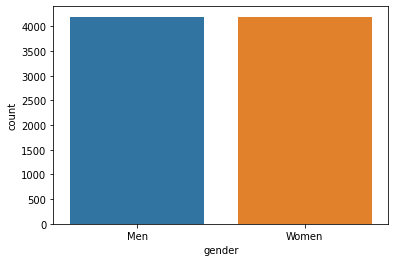

In [6]:
gender_df = df.gender.replace(0, "Men").replace(1, "Women").to_frame(name='gender')
sns.countplot(x='gender', data=gender_df)

##### Findings
- Same ratio between men and women 

</br>

In [136]:
col_mapping = {"attr": "Attractive", "sinc": "Sincere", "intel": "Intelligent", "fun": "Fun", "amb": "Ambitious", "shar": "Shared Interest"}

def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

2. What are participants looking for in their matches ?

In [138]:
cols = ["iid", "pid", "dec", "gender", "attr", "sinc", "intel", "fun", "amb", "shar", "like", "prob"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))

# _df[_df.pid.isna()].head(3)
# Remove records those which has no pid 
_df.dropna(how='any', axis=0, subset=['pid'], inplace=True)

# Drop rows where all attributes are NaN (col 4-9)
# Since in the instructions it clearly outlined that not attributes will be discussed during the couple's meetings, we cannot do a full NaN drop in the data. 
# The workaround here is to drop all rows where all the attributes are NaN
# Removing only for columns 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar' & 'like'

attr_cols = cols[4:-2]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True)

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Men'),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Women'),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches ?'),
        polar={'radialaxis': {'visible': False}},
        showlegend=True
    )
)

fig.show()

Columns with NaN values: ['pid', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar', 'like', 'prob']


##### Findings
- For male participants, the attractiveness of the female is given a lot more weight, and the ambitiousness or if they have any shared interset are ranked not as high
- For females, the points are more evenly distributed across all of the attributes, with ambitious and intelligence ranked slightly higher compared to others.

##### Personal conclusion
- Men are looking for attractive women, and are less concerned with a woman’s abmition and shared interests. 
- On the other hand, women are looking for a well-rounded male and value intelligence in a man.

3. What do participants think the opposite sex is looking for ?

In [163]:
cols = ["iid", "gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1"]
_df = df[cols]
print("Columns with NaN values: {}".format(_df.columns[_df.isna().any()].tolist()))
_df.groupby('gender').describe()
_df.groupby('gender').nunique()

Columns with NaN values: ['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1']


iid                                                             \
         count        mean         std   min     25%    50%    75%    max   
gender                                                                      
0       4184.0  275.430210  157.881194   1.0  148.00  266.0  393.0  530.0   
1       4194.0  291.902003  158.873643  11.0  163.25  287.0  411.0  552.0   

       attr1_1                                                          \
         count       mean        std   min    25%     50%   75%    max   
gender                                                                   
0       4125.0  18.055224   9.496919  0.00  13.04  15.380  20.0   90.0   
1       4174.0  26.921689  13.669663  6.67  20.00  23.905  30.0  100.0   

       sinc1_1                                                    intel1_1  \
         count       mean       std  min   25%    50%   75%   max    count   
gender                                                                       
0       4125.0  18.305008  6.755334  0.0  15.0  20.00  20.0  60.0   4125.0   
1       4174.0  16.498436  7.212455  0.0  10.0  17.39  20.0  40.0   4174.0   

                                                             fun1_1  \
             mean       std  min    25%   50%    75%    max   count   
gender                                                                
0       21.002502  6.778147  2.0  18.00  20.0  25.00  50.00  4125.0   
1       19.537374  6.709546  0.0  16.67  20.0  23.08  42.86  4164.0   

                                                           amb1_1             \
             mean       std  min   25%    50%   75%   max   count       mean   
gender                                                                         
0       17.147292  5.532110  0.0  15.0  17.78  20.0  40.0  4125.0  12.827222   
1       17.763893  6.573848  0.0  15.0  18.75  20.0  50.0  4154.0   8.552829   

                                               shar1_1                       \
             std  min   25%   50%    75%   max   count       mean       std   
gender                                                                        
0       5.481803  0.0  10.0  15.0  16.67  30.0  4103.0  12.704194  5.796059   
1       5.985803  0.0   5.0  10.0  12.00  53.0  4154.0  10.996574  6.770200   

                                       
        min   25%    50%    75%   max  
gender                                 
0       0.0  10.0  13.21  16.00  30.0  
1       0.0   5.0  10.00  15.34  30.0

,iid,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1
gender,,,,,,,
0,274,53,52,40,44,44,52
1,277,61,57,46,54,62,58


In [164]:
attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True)
_df['attr_sum'] = _df[attr_cols].sum(axis=1)
_df.head()

,iid,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1,attr_sum
0,1,0,15.0,20.0,20.0,15.0,15.0,15.0,100.0
1,1,0,15.0,20.0,20.0,15.0,15.0,15.0,100.0
2,1,0,15.0,20.0,20.0,15.0,15.0,15.0,100.0
3,1,0,15.0,20.0,20.0,15.0,15.0,15.0,100.0
4,1,0,15.0,20.0,20.0,15.0,15.0,15.0,100.0


In [175]:
def col_normalize(df: pd.DataFrame) -> pd.DataFrame:
    df['attr1_1'] = (df['attr1_1'] / df['attr_sum']) * 100
    df['sinc1_1'] = (df['sinc1_1'] / df['attr_sum']) * 100
    df['intel1_1'] = (df['intel1_1'] / df['attr_sum']) * 100
    df['fun1_1'] = (df['fun1_1'] / df['attr_sum']) * 100
    df['amb1_1'] = (df['amb1_1'] / df['attr_sum']) * 100
    df['shar1_1'] = (df['shar1_1'] / df['attr_sum']) * 100
    return df

In [177]:
_df.where(_df.attr_sum <= 100, lambda df: col_normalize(df)).attr_sum.unique()

array([100.  ,  99.99,  99.99, 120.  , 148.  ,  90.  , 101.  , 100.02,
       100.01, 100.01,  99.99, 100.  , 100.02,  99.98, 100.  , 110.  ,
        95.  ])

In [ ]:

# Sum of columns: 'attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1' & 'shar1_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Men'),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Women'),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches ?'),
        polar={'radialaxis': {'visible': False}},
        showlegend=True
    )
)

fig.show()